<a href="https://colab.research.google.com/github/anthef/anthef.github.io/blob/master/ristek2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Library and Data

In [ ]:
import pandas as pd
import json
import numpy as np
import ast
import matplotlib.pyplot as plt

In [ ]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
sample = pd.read_csv("sample_submission.csv")
rute = pd.read_json("routes.json")
with open("jalanraya_ui_flowcoord.json", "r") as f:
    data = json.load(f)

df_red = pd.json_normalize(data["TRACK_RED"])
df_blue = pd.json_normalize(data["TRACK_BLUE"])
df_red["track"] = "TRACK_RED"
df_blue["track"] = "TRACK_BLUE"
jalan = pd.concat([df_red, df_blue], ignore_index=True)

# Exploratory Data Analysis

## Cek Null Values

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37391 entries, 0 to 37390
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   imei    37391 non-null  int64  
 1   ts      37391 non-null  object 
 2   lat     37391 non-null  float64
 3   lon     37391 non-null  float64
 4   color   37391 non-null  object 
 5   speed   37391 non-null  int64  
dtypes: float64(2), int64(2), object(2)
memory usage: 1.7+ MB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2311 entries, 0 to 2310
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      2311 non-null   int64  
 1   ts      2311 non-null   object 
 2   lat     2311 non-null   float64
 3   lon     2311 non-null   float64
 4   color   2311 non-null   object 
 5   speed   2311 non-null   int64  
dtypes: float64(2), int64(2), object(2)
memory usage: 108.5+ KB


Dapat dilihat bahwa pada data `Train` dan `Test` tidak terdapat null values

In [ ]:
train

,imei,ts,lat,lon,color,speed
0,200676,2024-09-14 07:03:42+07:00,-6.348028,106.828020,red,21
1,200676,2024-09-14 07:04:07+07:00,-6.348349,106.829501,red,17
2,200676,2024-09-14 07:04:59+07:00,-6.348961,106.831840,red,36
3,200676,2024-09-14 07:05:04+07:00,-6.349296,106.831973,red,22
4,200676,2024-09-14 07:05:45+07:00,-6.351046,106.831630,red,0
...,...,...,...,...,...,...
37386,230233,2024-09-27 22:16:42+07:00,-6.348520,106.827201,blue,14
37387,230233,2024-09-27 22:17:27+07:00,-6.350453,106.826290,blue,22
37388,230233,2024-09-27 22:17:52+07:00,-6.352271,106.825734,blue,30
37389,230233,2024-09-27 22:18:21+07:00,-6.352783,106.825438,blue,20


## Playing with rute

In [ ]:
rute.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31 entries, asrama_ui_01 to fh_0
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   RUTE_MERAH  17 non-null     object
 1   RUTE_BIRU   19 non-null     object
dtypes: object(2)
memory usage: 744.0+ bytes


In [ ]:
rute

,RUTE_MERAH,RUTE_BIRU
asrama_ui_01,"[-6.348371370044594, 106.82976588606834]","[-6.348371370044594, 106.82976588606834]"
menwa_stasiun_ui_01,"[-6.353501269466313, 106.83177955448627]","[-6.353501269466313, 106.83177955448627]"
stasiun_ui_pfh_01,"[-6.3610729008880185, 106.83170076459645]","[-6.3610729008880185, 106.83170076459645]"
fh_1,"[-6.364983, 106.832194]",NaN
balairung_1,"[-6.368123497380745, 106.83179095553365]",NaN
rik_1,"[-6.370236685157007, 106.83098517385237]",NaN
fkm_1,"[-6.3716668368337395, 106.82932819249058]",NaN
fik_1,"[-6.371088512673846, 106.82699791990328]",NaN
fmipa_1,"[-6.369809612830173, 106.82580587252201]",NaN
sor_1,"[-6.367011, 106.824423]",NaN


In [ ]:
def convert_str_to_list(x):
    if isinstance(x, str):
        try:
            return ast.literal_eval(x)
        except:
            return np.nan
    return x
rute1 = rute.copy()

rute['RUTE_MERAH'] = rute['RUTE_MERAH'].apply(convert_str_to_list)
rute['RUTE_BIRU']  = rute['RUTE_BIRU'].apply(convert_str_to_list)

In [ ]:
def parse_koordinate(_df = pd.DataFrame) -> pd.DataFrame:
    df = _df.copy()

    for idx, row in df.iterrows():
        if isinstance(row['RUTE_MERAH'], list):
            df.at[idx, 'RUTE_MERAH_LAT'] = row['RUTE_MERAH'][0]
            df.at[idx, 'RUTE_MERAH_LON'] = row['RUTE_MERAH'][1]

        if isinstance(row['RUTE_BIRU'], list):
            df.at[idx, 'RUTE_BIRU_LAT'] = row['RUTE_BIRU'][0]
            df.at[idx, 'RUTE_BIRU_LON'] = row['RUTE_BIRU'][1]

    return df

rute = parse_koordinate(rute)

In [ ]:
rute

,RUTE_MERAH,RUTE_BIRU,RUTE_MERAH_LAT,RUTE_MERAH_LON,RUTE_BIRU_LAT,RUTE_BIRU_LON
asrama_ui_01,"[-6.348371370044594, 106.82976588606834]","[-6.348371370044594, 106.82976588606834]",-6.348371,106.829766,-6.348371,106.829766
menwa_stasiun_ui_01,"[-6.353501269466313, 106.83177955448627]","[-6.353501269466313, 106.83177955448627]",-6.353501,106.831780,-6.353501,106.831780
stasiun_ui_pfh_01,"[-6.3610729008880185, 106.83170076459645]","[-6.3610729008880185, 106.83170076459645]",-6.361073,106.831701,-6.361073,106.831701
fh_1,"[-6.364983, 106.832194]",NaN,-6.364983,106.832194,NaN,NaN
balairung_1,"[-6.368123497380745, 106.83179095553365]",NaN,-6.368123,106.831791,NaN,NaN
rik_1,"[-6.370236685157007, 106.83098517385237]",NaN,-6.370237,106.830985,NaN,NaN
fkm_1,"[-6.3716668368337395, 106.82932819249058]",NaN,-6.371667,106.829328,NaN,NaN
fik_1,"[-6.371088512673846, 106.82699791990328]",NaN,-6.371089,106.826998,NaN,NaN
fmipa_1,"[-6.369809612830173, 106.82580587252201]",NaN,-6.369810,106.825806,NaN,NaN
sor_1,"[-6.367011, 106.824423]",NaN,-6.367011,106.824423,NaN,NaN


## Analisis Data Jalan Raya dan Rute

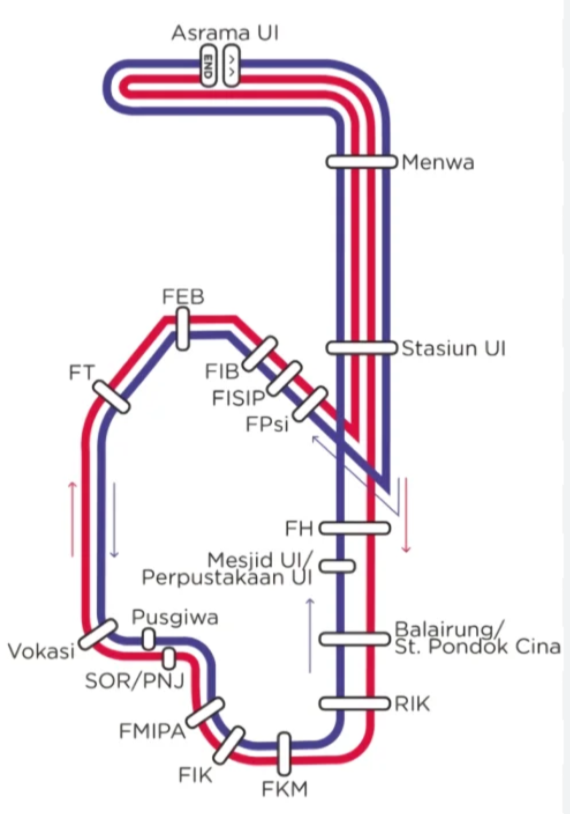

### Halte yang Hilang

In [ ]:
unique_id = rute.index.unique()
unique_names = jalan['name'].unique()

set_unique_id = set(unique_id)
set_unique_names = set(unique_names)

# Cari elemen yang ada di rute tapi tidak ada di jalan
diff_ids = set_unique_id.difference(set_unique_names)
print("Elemen di data jalan yang tidak ada di data rute:", diff_ids)

# Cari elemen yang ada di rute tapi tidak ada di jalan
diff_names = set_unique_names.difference(set_unique_id)
print("Elemen di data jalan yang tidak ada di data rute:", diff_names)

Elemen di rute yang tidak ada di jalan: {'fisip_1'}
Elemen di rute yang tidak ada di jalan: {None}


Dapat dilihat bahwa semua halte tercatat di data rute, namun terdapat yang hilang, di data jalan, yaitu halte `fisip_1` atau halte `fisip` di rute merah dan mari telaah lebih lanjut kenapa hal tersebut bisa terjadi.

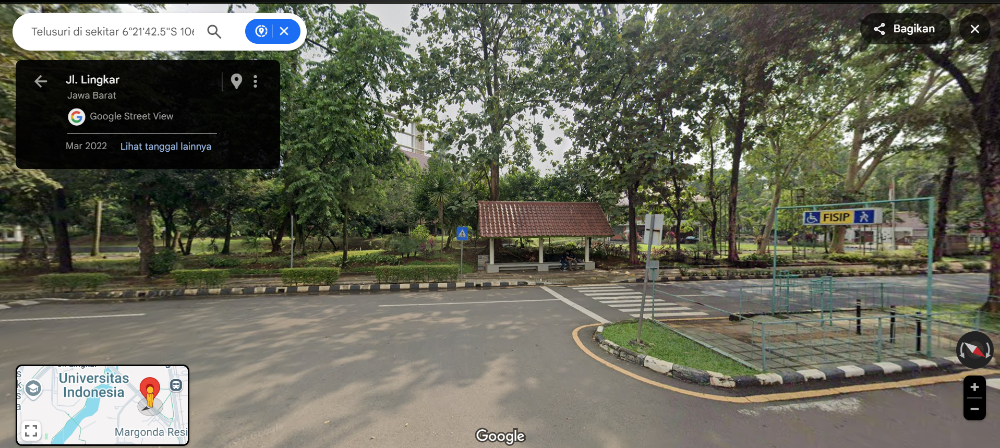

Dapat dilihat bahwa foto tersebut menunjukan `fisip_0` atau `halte fisip` di rute biru. Namun, jika dilihat dari map, berikut adalah foto dari halte yang tercatat sebagai fisip_1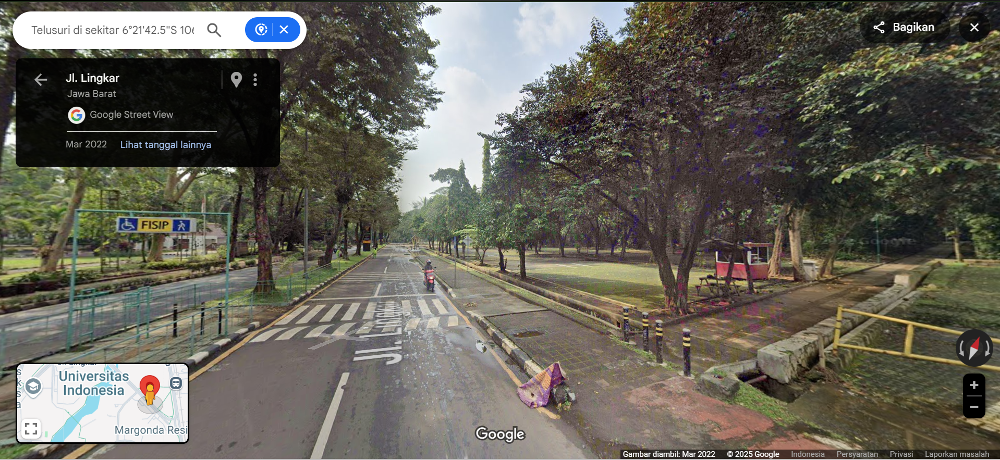

Halte fisip 1 tidak terdapat di data jalan karena `fisip_1` memang merupakan salah satu titik bikun berhenti namun hanya berbentuk trotoar dan tidak seperti halte yang lainnya.

### Multiple Values for One Coordinate

In [ ]:
jalan['name'].value_counts()

,count
name,
menwa_stasiun_ui_01,4
asrama_ui_01,2
stasiun_ui_asrama_01,2
asrama_ui_01_end,2
stasiun_ui_pfh_01,2
balairung_1,1
fib_0,1
mui_0,1
balairung_0,1


Dapat dilihat bahwa terdapat beberapa halte di data `jalan raya`yang dicatat dengan koordinat lebih dari satu, yaitu halte `menwa_stasiun_ui_01`,`asrama_ui_01`,`stasiun_ui_asrama_01`,`asrama_ui_01_end`,`stasiun_ui_pfh_01`

In [ ]:
row_asrama_in_rute = rute.loc['asrama_ui_01', ['RUTE_MERAH_LAT', 'RUTE_MERAH_LON', 'RUTE_BIRU_LAT', 'RUTE_BIRU_LON']]
row_asrama_in_rute

,asrama_ui_01
RUTE_MERAH_LAT,-6.348371
RUTE_MERAH_LON,106.829766
RUTE_BIRU_LAT,-6.348371
RUTE_BIRU_LON,106.829766


In [ ]:
row_asrama_in_jalan = jalan[jalan['name'] == 'asrama_ui_01']
row_asrama_in_jalan

,name,latitude,longitude,track
2,asrama_ui_01,-6.348394,106.829766,TRACK_RED
455,asrama_ui_01,-6.348394,106.829766,TRACK_BLUE


Berdasarkan salah satu contoh yang diberikan, untuk track merah, pada data terlihat perbedaan value yang cukup tipis dan apabila ditelaah lebih lanjut maka berikut foto untuk koordinat (-6.348371,106.829766) alias dari data `rute`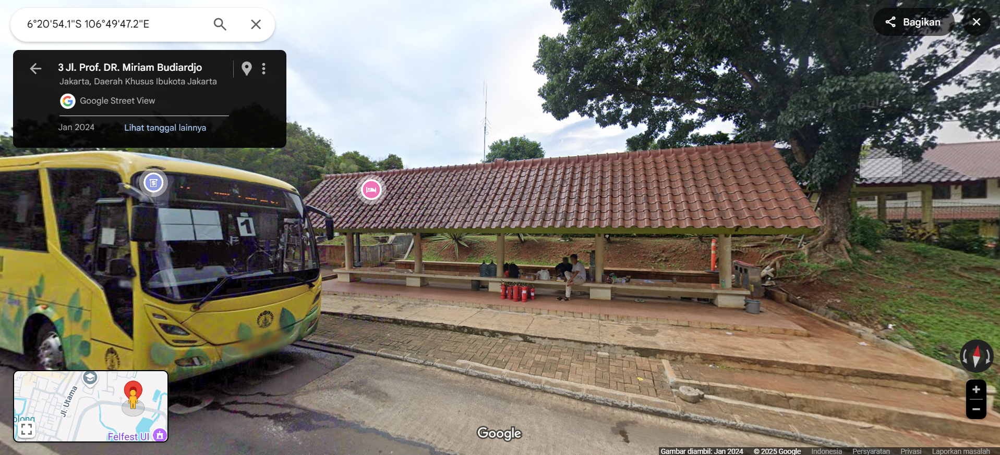

Dan berikut foto untuk untuk koordinat (-6.348394,106.829766) alias dari data `jalan_raya`
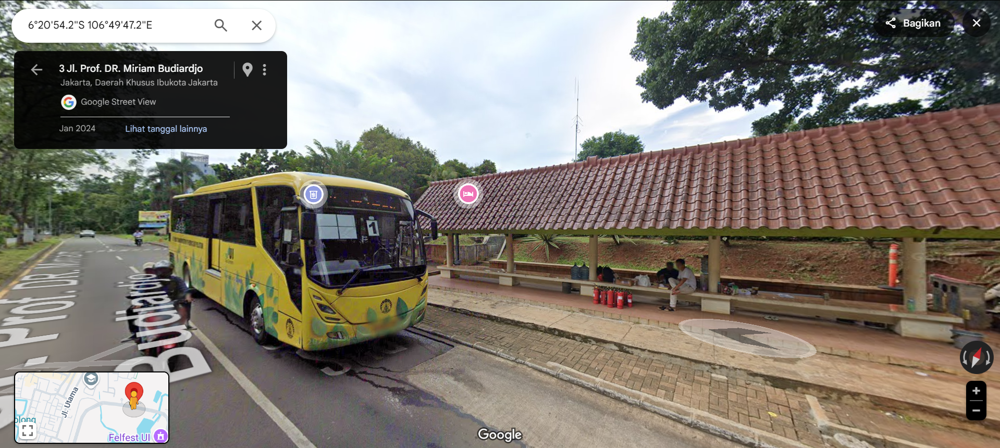

Dapat dilihat bahwa satu halte terdiri dari beberapa titik yang bisa mewakili titik ujung halte, titik tengah, ataupun titik lainnya yang masih tergolong dalam halte tersebut. Oleh karena itu, untuk menentukan nantinya apakah suatu koordinat sudah tergolong sebagai suatu halte atau bukan akan diambil dari range yang memungkinkan untuk menggambarkan suatu halte

## Analisis Train

### Analisis outlier

In [111]:
train.describe()

,imei,lat,lon,speed
count,37391.000000,37391.000000,37391.000000,37391.000000
mean,222375.448102,-6.360225,106.828919,13.052820
std,13177.392617,0.007430,0.003155,13.125661
min,200452.000000,-6.372050,106.821224,0.000000
25%,200676.000000,-6.366280,106.826359,0.000000
50%,230233.000000,-6.361088,106.830123,11.000000
75%,230459.000000,-6.353390,106.831558,24.000000
max,230542.000000,-6.347990,106.832636,107.000000


Terlihat dari data train kolom `speed` terdapat hal yang janggal. Hal ini dikarenakan speed 107 km/jam merupakan hal yang tidak wajar untuk suatu bikun berjalan. Mari telaah lebih lanjut apakah kecepatan merupakan suatu hal yang wajar atau kesalahan penginputan data.

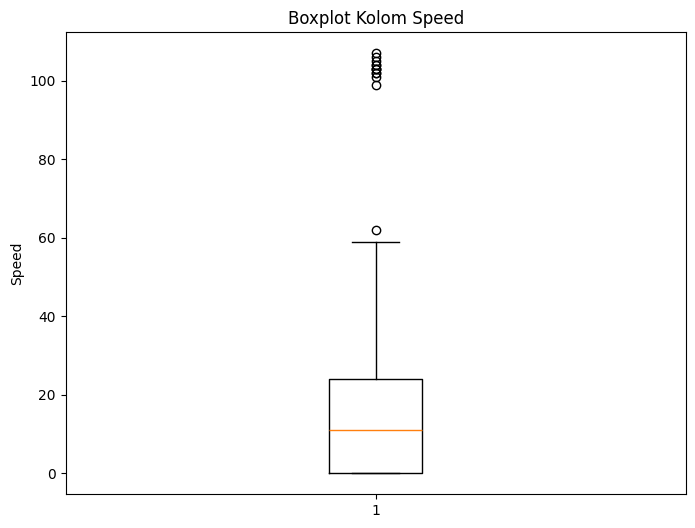

In [115]:
plt.figure(figsize=(8, 6))
plt.boxplot(train['speed'])
plt.title('Boxplot Kolom Speed')
plt.ylabel('Speed')
plt.show()

Terdapat beberapa titik yang menjadi outlier. 60 km/jam masih menjadi batas kecepatan yang wajar karena terkadang kalo jalan dalam keadaan sepi, suatu bis seringkali mencapai kecepatan tersebut.

In [116]:
Q1 = train['speed'].quantile(0.25)
Q3 = train['speed'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR


outliers = train[(train['speed'] < lower_bound) | (train['speed'] > upper_bound)]
jumlah_outlier = outliers.shape[0]

print("Jumlah outlier:", jumlah_outlier)
print("Baris-baris outlier:")
print(outliers)

Jumlah outlier: 13
Baris-baris outlier:
         imei                         ts       lat         lon color  speed
944    230006  2024-09-14 08:08:29+07:00 -6.348403  106.829866   red    102
7671   200676  2024-09-23 21:19:31+07:00 -6.371726  106.829471   red    106
9509   230233  2024-09-23 08:45:45+07:00 -6.363480  106.824115  blue    105
12391  230233  2024-09-23 14:56:24+07:00 -6.363132  106.830163  blue    103
12995  230233  2024-09-23 17:27:20+07:00 -6.368811  106.825056  blue    104
13311  230233  2024-09-23 20:23:07+07:00 -6.364443  106.830684  blue    103
13312  230233  2024-09-23 20:23:10+07:00 -6.362950  106.830569  blue    102
13313  230233  2024-09-23 20:23:34+07:00 -6.354367  106.829905  blue    107
17787  230233  2024-09-24 07:15:34+07:00 -6.366975  106.824786   red    104
17963  230233  2024-09-24 09:18:31+07:00 -6.362951  106.831815   red     99
20030  230507  2024-09-24 15:58:04+07:00 -6.348661  106.826978  blue    103
20031  230507  2024-09-24 15:58:29+07:00 -6.3486

### Observasi untuk Tiap Jalur Bis

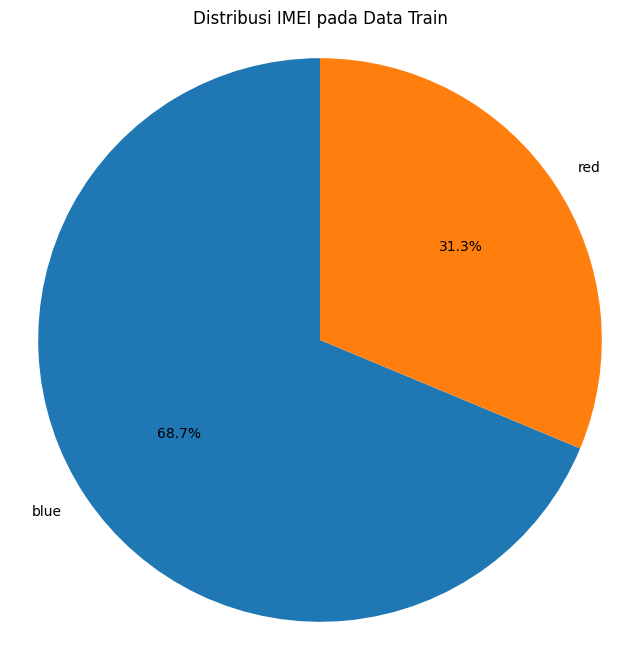

In [124]:
imei_counts = train['color'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(imei_counts.values, labels=imei_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("Distribusi IMEI pada Data Train")
plt.axis('equal')
plt.show()

Dapat dilihat bahwa track `blue` mendominasi `red` atau data bersifat imbalance, namun ini tidak akan mempengaruhi apapun karena untuk track `blue` dan track `red` akan dilakukan prediksi secara individual.

### Analisis data train per imei

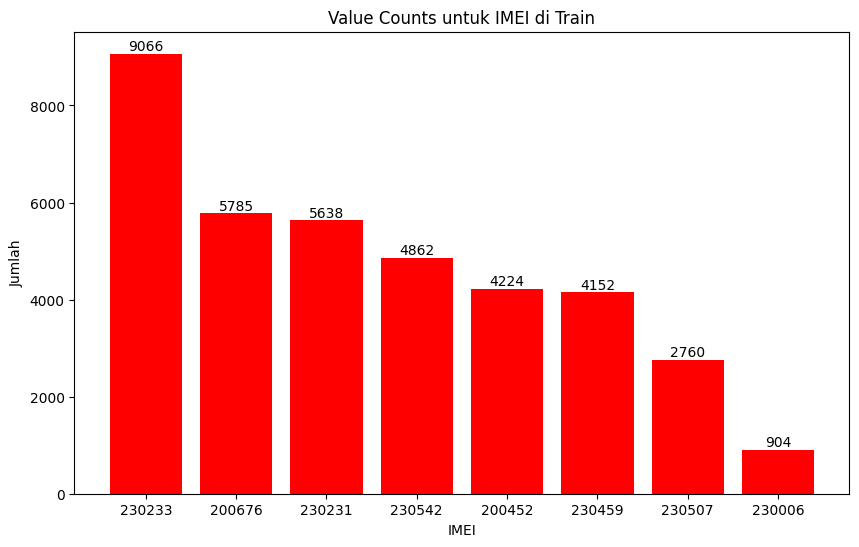

In [121]:
imei_counts = train['imei'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(imei_counts.index.astype(str), imei_counts.values, color="red")
plt.xlabel("IMEI")
plt.ylabel("Jumlah")
plt.title("Value Counts untuk IMEI di Train")

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, int(height), ha='center', va='bottom')

plt.show()

Dapat dilihat, bahwa pengamatan pada data train dibagi menjadi 8 observasi, yaitu `230233`, `200676`, `230231`, `230542`, `230452`, `200452`, `230459`, `230507`, dan `230006`

<Figure size 1000x600 with 0 Axes>

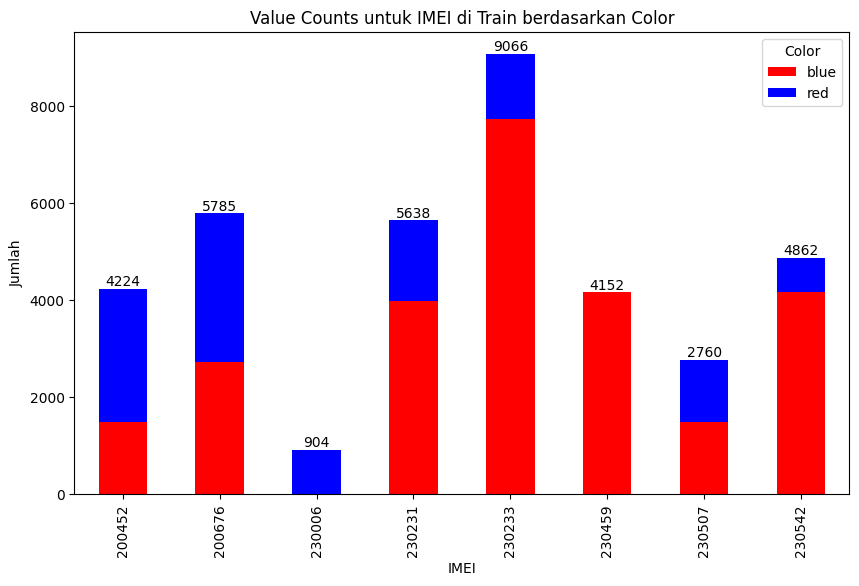

In [122]:
counts = train.groupby(['imei', 'color']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
ax = counts.plot(kind='bar', stacked=True, figsize=(10,6), color=['red', 'blue'])

plt.xlabel("IMEI")
plt.ylabel("Jumlah")
plt.title("Value Counts untuk IMEI di Train berdasarkan Color")
plt.legend(title='Color')

for i, total in enumerate(counts.sum(axis=1)):
    plt.text(i, total, str(total), ha='center', va='bottom')

plt.show()

# Modelling

In [ ]:
def rmsle(actual, forecast):
    return np.sqrt(np.mean((np.log1p(actual) - np.log1p(forecast)) ** 2))